# 1. Import required packages

In [1]:
import os

import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.neural_network import MLPClassifier

import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

In [2]:
import numpy as np
import pandas as pd
import anndata as ad
from scipy.sparse import csr_matrix
print(ad.__version__)

0.8.0


# 2. Preprocessing

## 2.1 Load AnnData and remove the labeled low quality cells

Below data can be generated by notebook as:

[1_construct_sn_rna_mop_from_10x_aibs_counts](1_construct_sn_rna_mop_from_10x_aibs_counts.ipynb)

In [3]:
# load from here for saved raw h5ad
data_path=r'L:\Shiwei\DNA_MERFISH_analysis\10x_nuclei_v3_MOp_AIBS\Analysis_10X_nuclei_v3_AIBS\processed'
adata = sc.read(os.path.join(data_path,r'MOp_10x_sn_filtered.h5ad'))
len(adata)

40166

In [4]:
np.unique(adata.obs['class_label'].tolist())

array(['GABAergic', 'Glutamatergic', 'Non-Neuronal'], dtype='<U13')

In [5]:
np.unique(adata.obs['subclass_label'].tolist())

array(['Astro', 'Endo', 'L2/3 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT',
       'L6 IT', 'L6b', 'Lamp5', 'Macrophage', 'OPC', 'Oligo', 'Pvalb',
       'Sncg', 'Sst', 'Vip'], dtype='<U10')

## 2.2 Calculate the QC and inspect the data

In [6]:
adata.var

,gene_ids,feature_types,genome,n_cells,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
Xkr4,ENSMUSG00000051951,Gene Expression,mm10-3.0.0_premrna,56494,39642,18.981079,1.304586,762394.0
Gm1992,ENSMUSG00000089699,Gene Expression,mm10-3.0.0_premrna,27826,22458,1.614375,44.087039,64843.0
Gm37381,ENSMUSG00000102343,Gene Expression,mm10-3.0.0_premrna,531,402,0.011378,98.999154,457.0
Rp1,ENSMUSG00000025900,Gene Expression,mm10-3.0.0_premrna,2526,1941,0.055171,95.167555,2216.0
Sox17,ENSMUSG00000025902,Gene Expression,mm10-3.0.0_premrna,40,20,0.002714,99.950207,109.0
...,...,...,...,...,...,...,...,...
AC168977.2,ENSMUSG00000094915,Gene Expression,mm10-3.0.0_premrna,7,6,0.000149,99.985062,6.0
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10-3.0.0_premrna,30,25,0.000697,99.937758,28.0
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10-3.0.0_premrna,63283,39257,12.481999,2.263108,501352.0
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10-3.0.0_premrna,6785,4887,0.193447,87.832993,7770.0


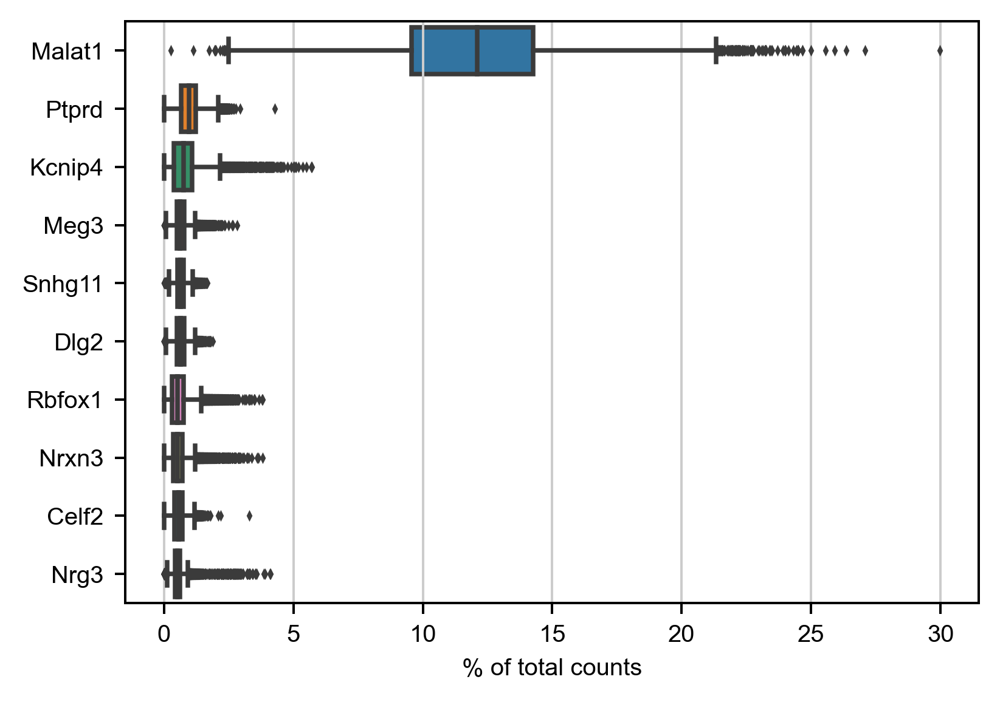

In [7]:
sc.pl.highest_expr_genes(adata, n_top=10, )

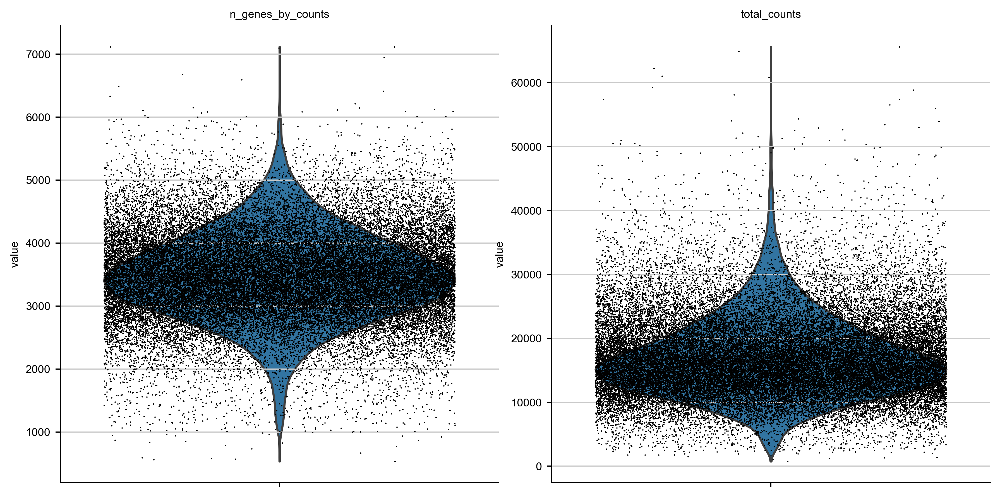

In [8]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

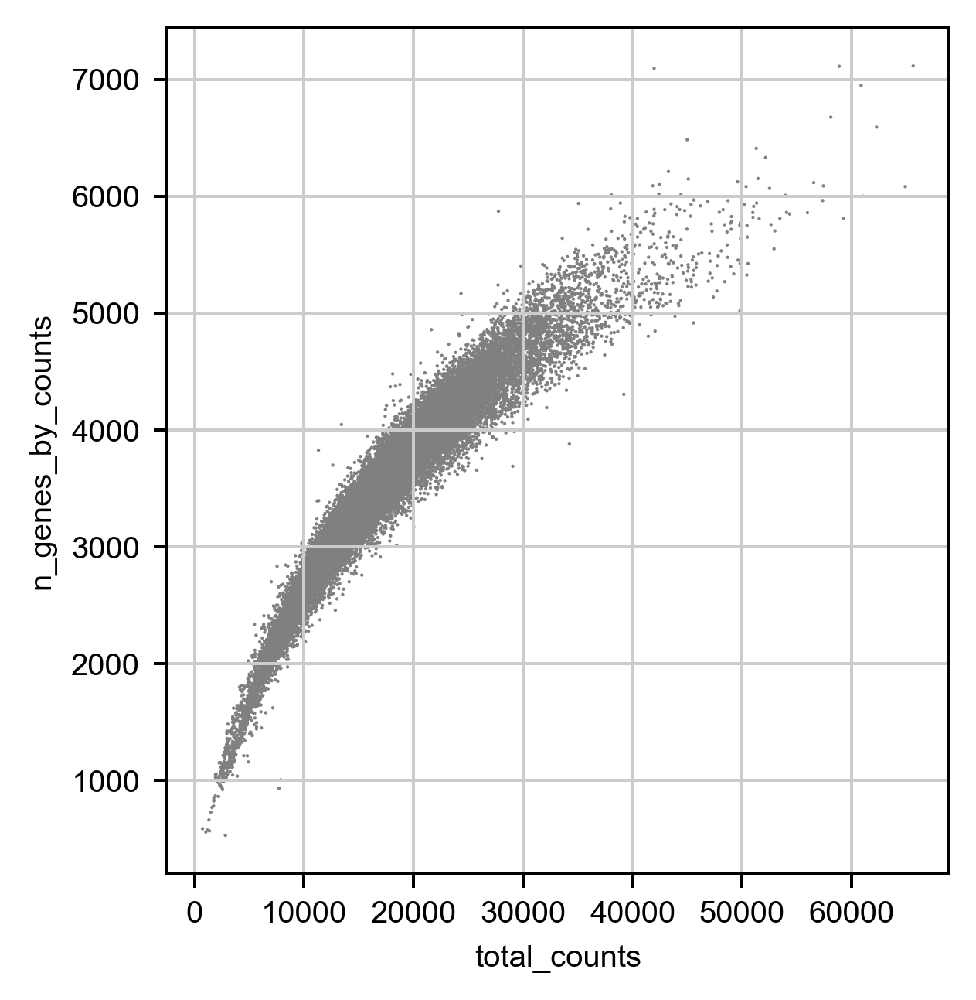

In [9]:
#sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
# There is not much correlation between total counts and genes_by_counts for the SMART-seq which has high depth for reads
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [10]:
# filter out some outiliers based on the total counts and n_gene_by_counts
print(len(adata))
adata = adata[adata.obs['total_counts'] > 100]
adata = adata[adata.obs['n_genes_by_counts'] > 100]
print(len(adata))

40166
40166


In [31]:
adata.X[:10,:10].toarray()

array([[49.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.],
       [14.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  2.,  0.],
       [42.,  1.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  3.],
       [58.,  0.,  0.,  1.,  0.,  0.,  2.,  0.,  1.,  4.],
       [70.,  3.,  0.,  0.,  0.,  0.,  6.,  0.,  2.,  3.],
       [33.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.],
       [51.,  0.,  0.,  0.,  0.,  0.,  4.,  0.,  1.,  2.],
       [32.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.],
       [29.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.],
       [36.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]], dtype=float32)

## 2.3 Save adata raw for retrieving info during subsequent analyese

In [11]:
# set the un-normalized as the raw
adata.raw = adata

## 2.4 Normalization and scaling

In [12]:
np.median(adata.obs['total_counts'])

16088.0

In [14]:
# library size control; normalize to the median
sc.pp.normalize_total(adata, target_sum=1.5*1e4 )

In [15]:
adata.X[:5,:5].toarray()

array([[22.131664 ,  4.7424994,  0.       ,  0.       ,  0.       ],
       [10.6767   ,  0.       ,  0.       ,  0.       ,  0.       ],
       [22.590363 ,  1.6135973,  0.       ,  0.       ,  0.       ],
       [10.560406 ,  0.       ,  0.       ,  0.       ,  0.       ],
       [ 8.437236 ,  0.       ,  0.       ,  0.       ,  0.       ]],
      dtype=float32)

In [16]:
# check if raw is preserved after normalization
adata_ori = adata.raw.to_adata()
adata_ori.X[:5,:5].toarray()

array([[42.,  9.,  0.,  0.,  0.],
       [14.,  0.,  0.,  0.,  0.],
       [14.,  1.,  0.,  0.,  0.],
       [10.,  0.,  0.,  0.,  0.],
       [12.,  0.,  0.,  0.,  0.]], dtype=float32)

## 2.5 Show expression as log1p format

In [17]:
# log1p to scale the counts to center around 0
# log(1+x) 
#  The +1 makes sure that 0 values in the original data still map to 0 in log space (and prevents us from trying to take the log of 0). This makes the expression values more closely approximate a Gaussian distribution, 
#which is an assumption inherent to many downstream analysis methods
sc.pp.log1p(adata)

## 2.6 Only use highly variable genes for culstering 

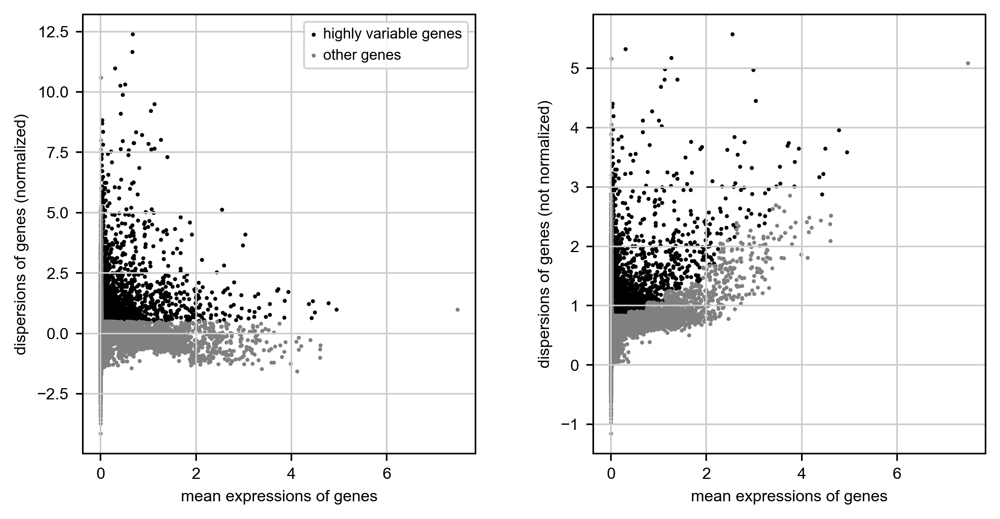

In [18]:
# check higly varibale genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=6, min_disp=0.5)

sc.pl.highly_variable_genes(adata)

In [19]:
#Keep only the variable genes and regress by total count
adata = adata[:, adata.var.highly_variable]

# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')  # because it appears the detection efficiency is also determing the numbber


In [20]:
# Clip values exceeding standard deviation 10.
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

# 3. PCA analysis

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


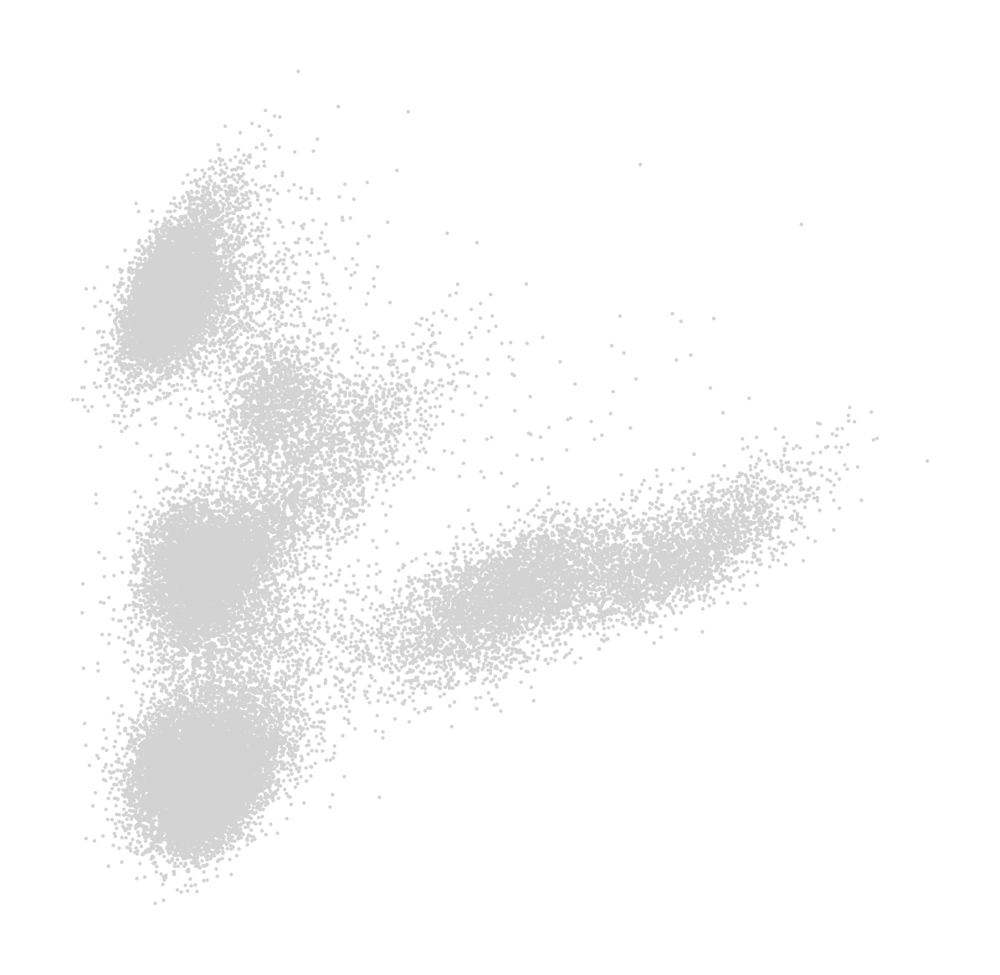

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8942 (\N{VERTICAL ELLIPSIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


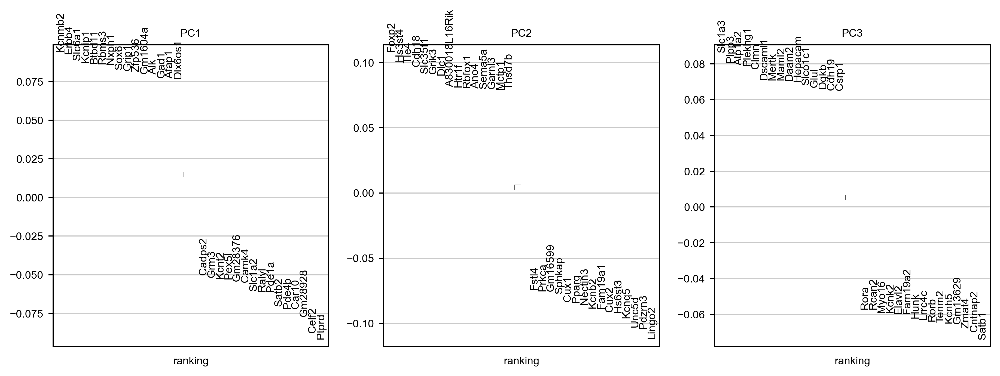

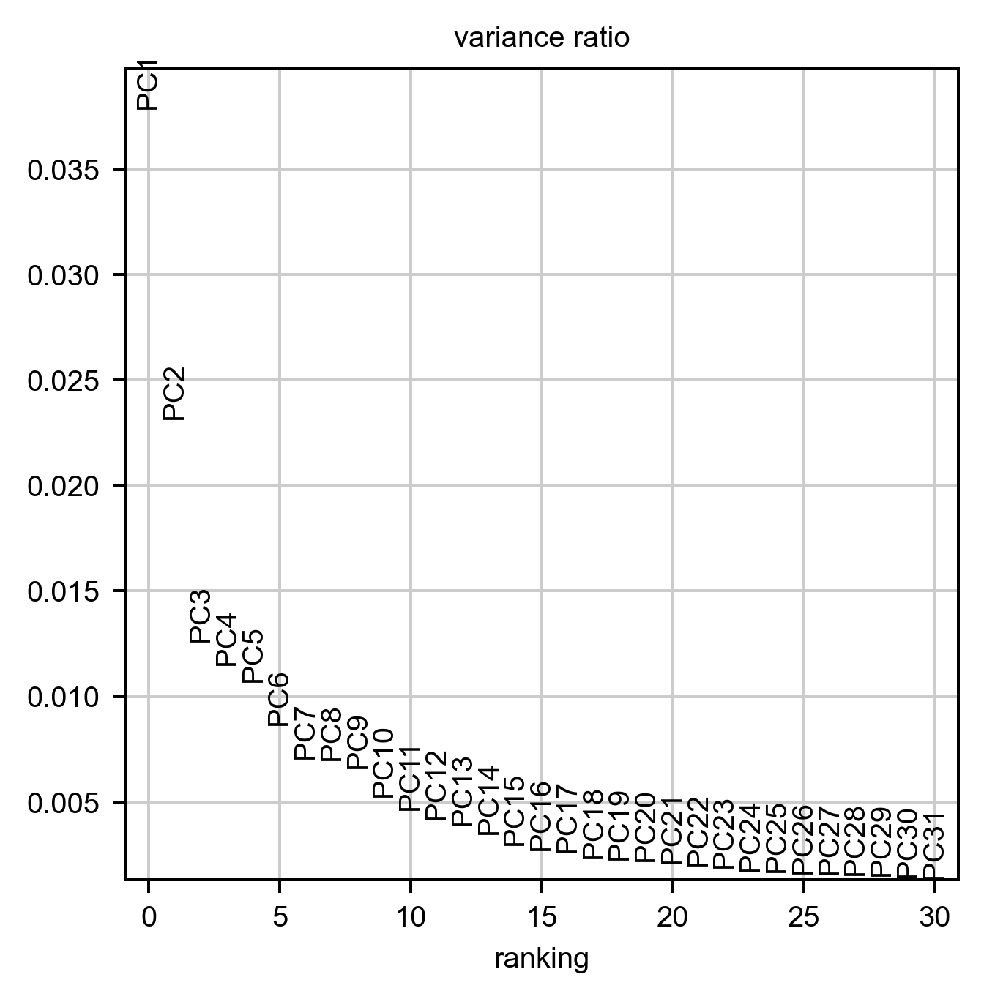

In [21]:
sc.pp.pca(adata)
sc.pl.pca_overview(adata)

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


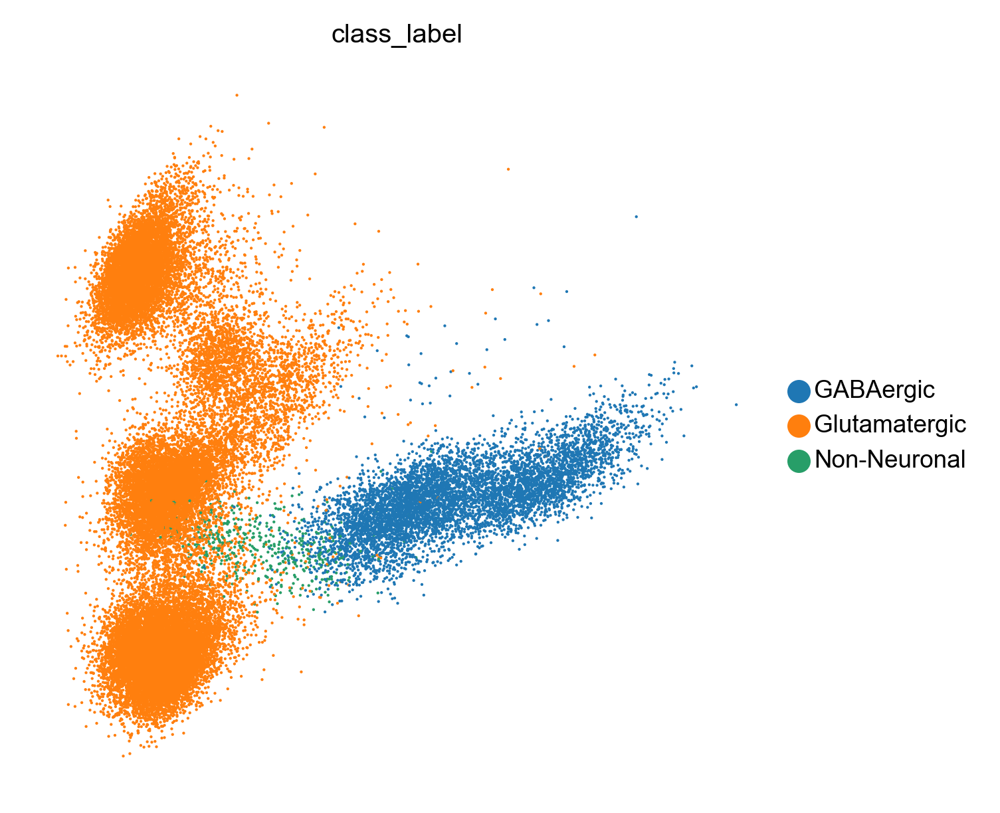

In [22]:
# check if PCA makes sense by plotting agianst the pre-labeled class

sc.pl.pca(adata, color='class_label')

# 4. Neighborhood and clustering

In [23]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


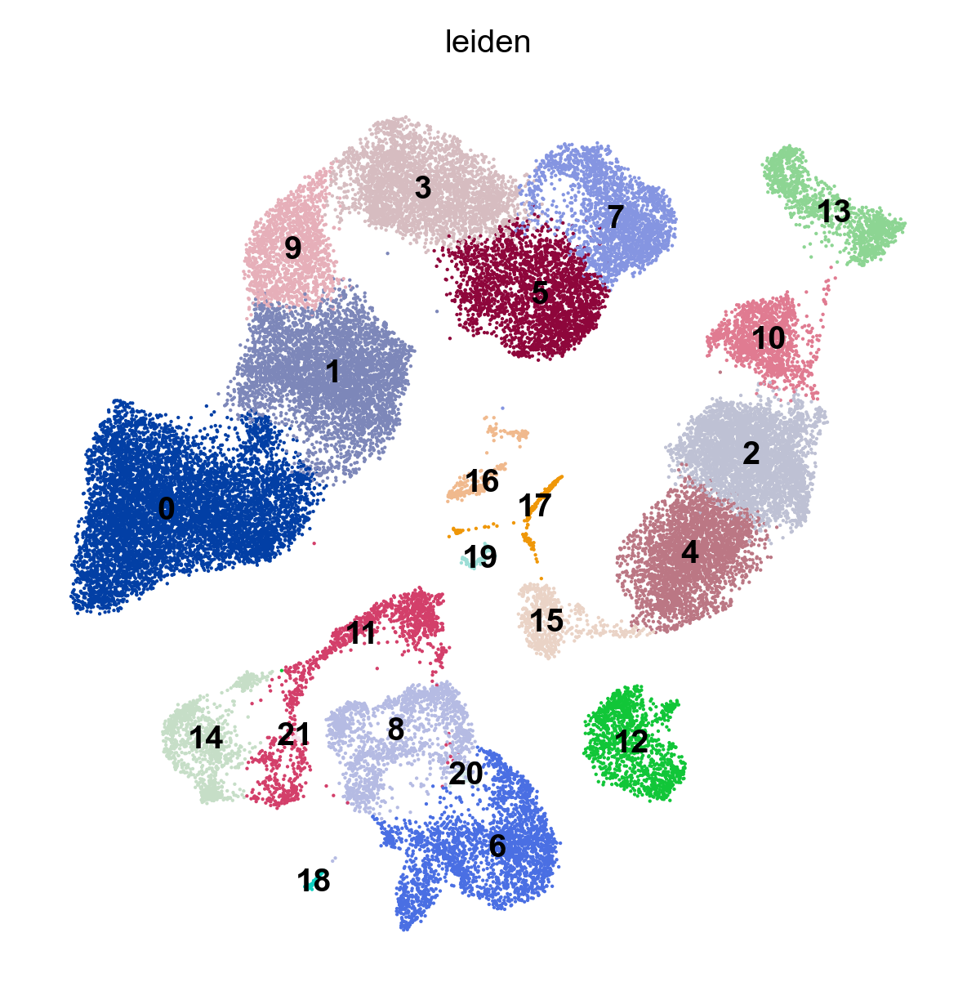

CPU times: total: 1min 23s
Wall time: 36 s


In [24]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=0.5)

# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


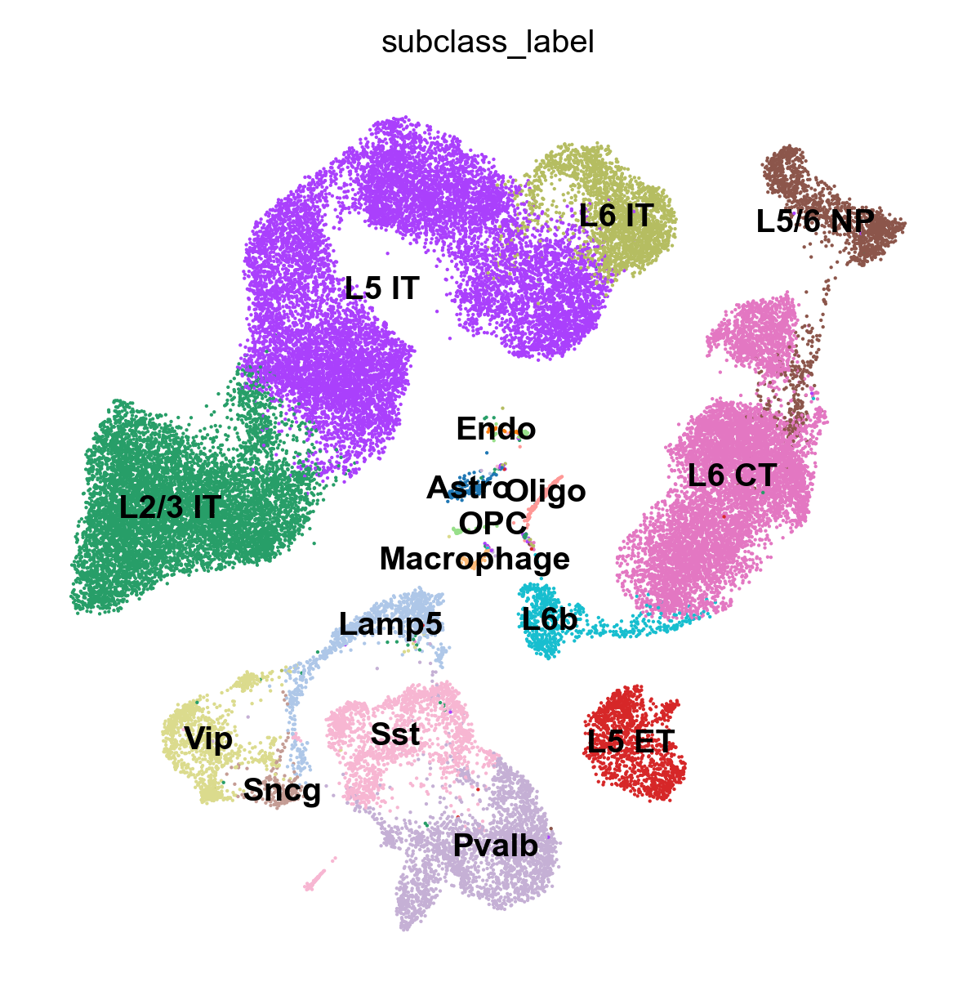

In [25]:
# Plot the UMAP
sc.pl.umap(adata, color='subclass_label', legend_loc='on data')

# 5. Re-label subclass to match MERFISH result

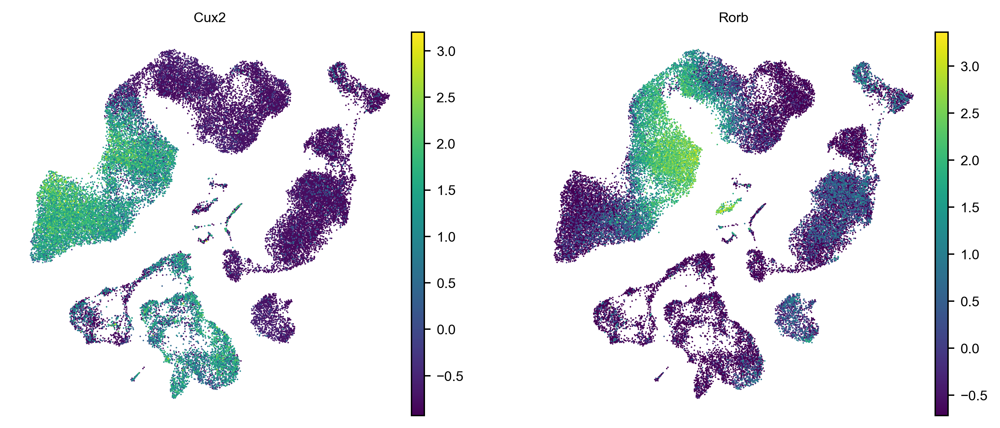

In [26]:
# try distingish L4/5 IT and L5 IT (leiden 2, 16, 3) by gene expression

#adata_ori = adata.raw.to_adata()

marker_genes =  ['Slc30a3','Cux2', 'Rorb']
marker_genes = [g for g in marker_genes if (g in adata.var.index)]

sc.pl.umap(adata, color=marker_genes, use_raw=False)

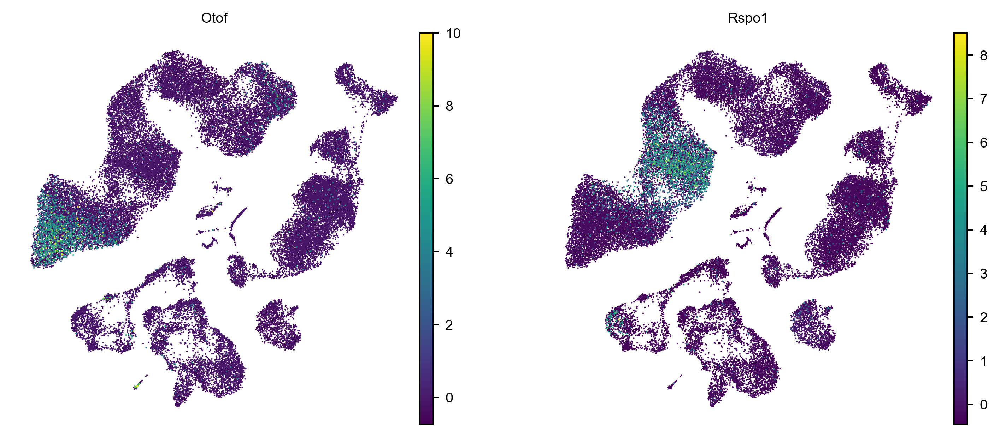

In [27]:
# try distingish L4/5 IT and L5 IT (leiden 2, 16, 3) by gene expression

#adata_ori = adata.raw.to_adata()

marker_genes =  ['Otof','Rspo1']
marker_genes = [g for g in marker_genes if (g in adata.var.index)]

sc.pl.umap(adata, color=marker_genes, use_raw=False)

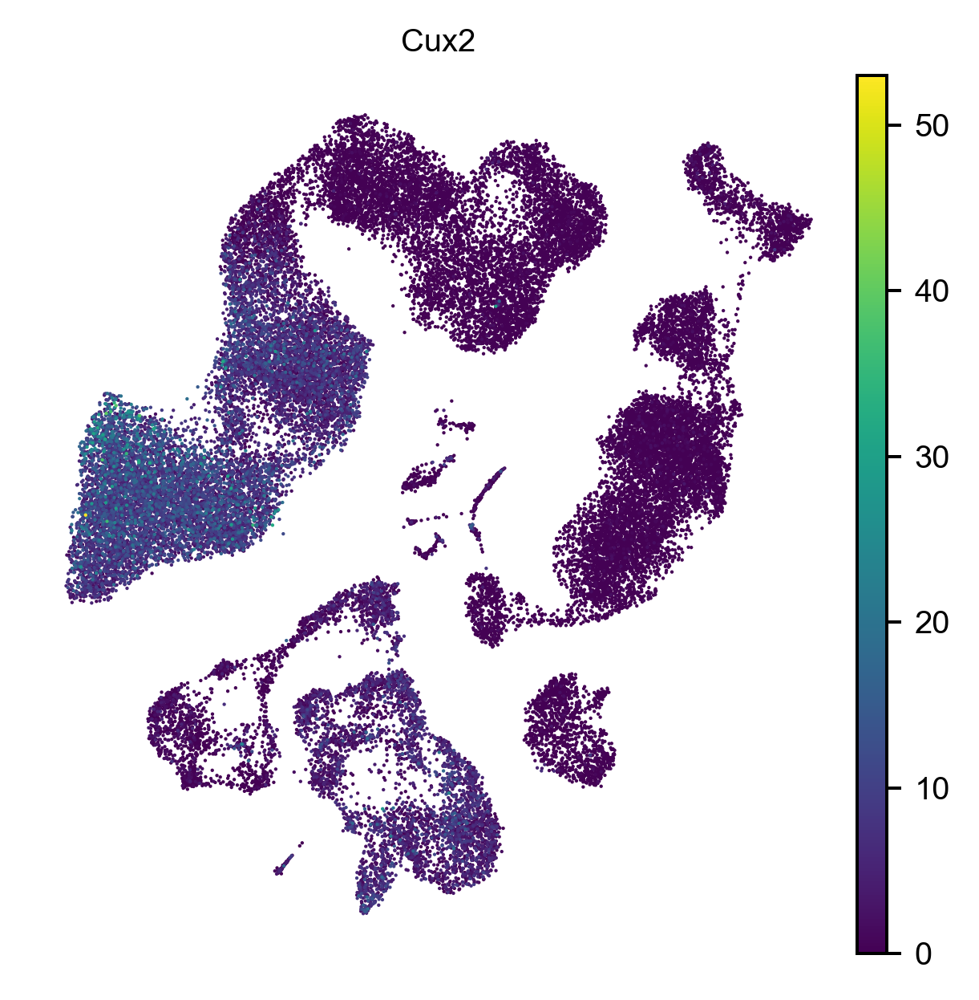

In [30]:
# check CUX2 from the original genes 
adata_ori = adata.raw.to_adata()
sc.pl.umap(adata_ori, color=['Cux2'], use_raw=False)

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


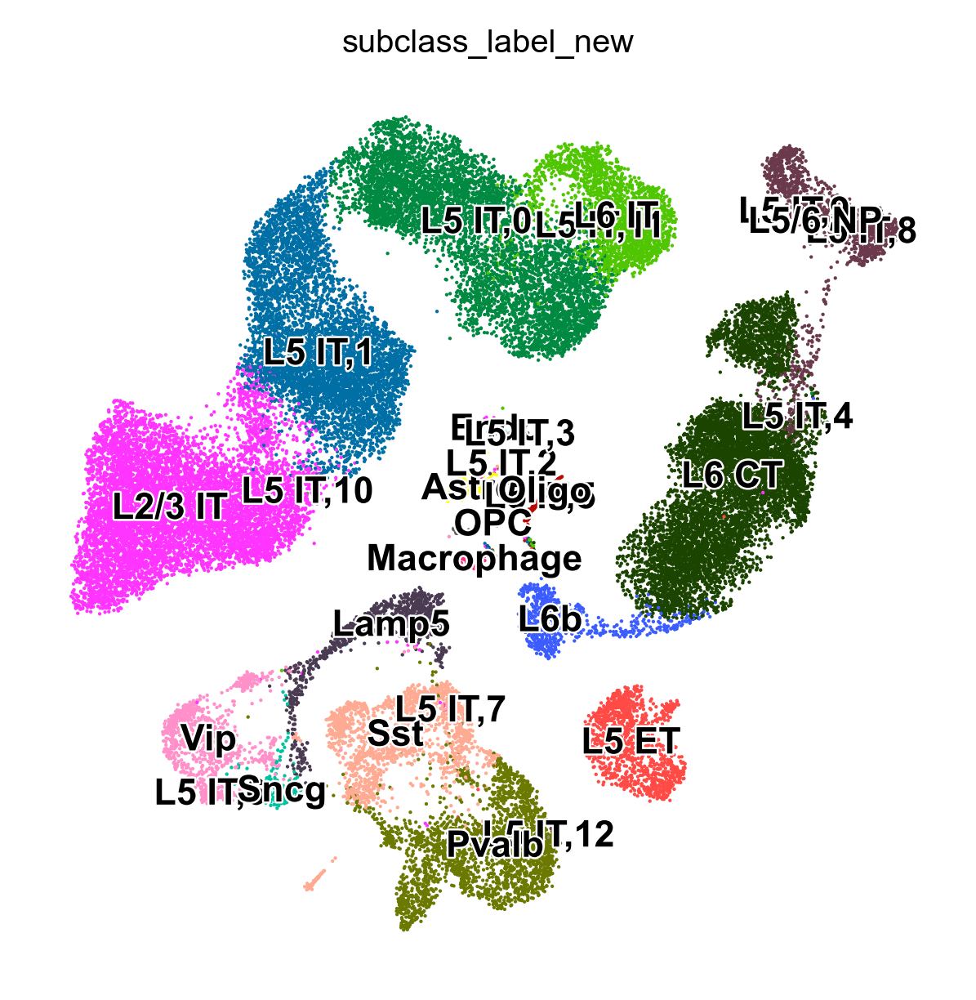

CPU times: total: 1min 22s
Wall time: 32.5 s


In [31]:
%%time
# sub-split the L5 IT  to obtain  L4/5 IT and L5 IT and compare the above marker gene map
# adjust resolution to test
sc.tl.leiden(adata, resolution=0.05,restrict_to=('subclass_label',['L5 IT']),
           key_added='subclass_label_new')


sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='subclass_label_new', 
           legend_loc='on data',legend_fontsize=9,legend_fontoutline=1)

In [32]:
sub_L5_list = [c for c in np.unique(adata.obs['subclass_label_new'].tolist()) if 'L5 IT' in c]
sub_L5_list

['L5 IT,0',
 'L5 IT,1',
 'L5 IT,10',
 'L5 IT,11',
 'L5 IT,12',
 'L5 IT,2',
 'L5 IT,3',
 'L5 IT,4',
 'L5 IT,5',
 'L5 IT,6',
 'L5 IT,7',
 'L5 IT,8',
 'L5 IT,9']

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


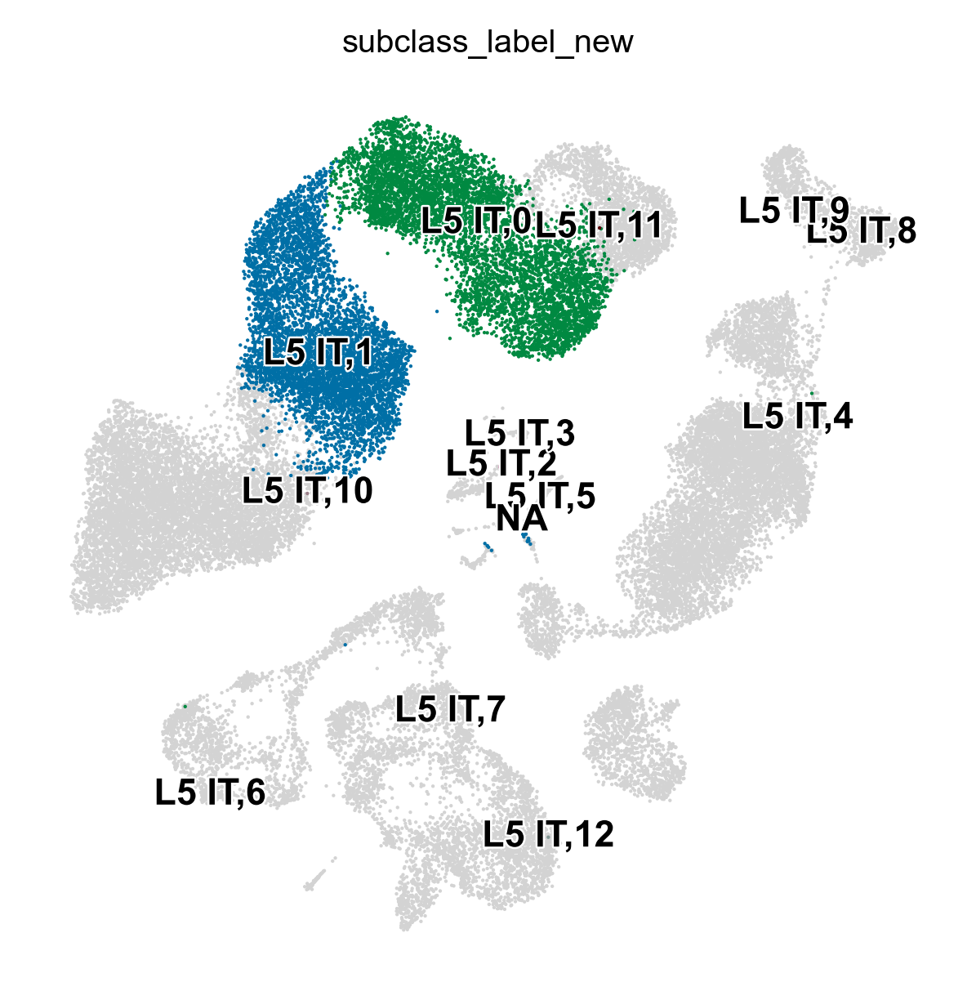

In [33]:
sc.pl.umap(adata, color='subclass_label_new', groups=sub_L5_list, legend_loc='on data',
           legend_fontsize=9,legend_fontoutline=1)

In [34]:
other_sub_L5_list = sub_L5_list[2:]
other_sub_L5_list

['L5 IT,10',
 'L5 IT,11',
 'L5 IT,12',
 'L5 IT,2',
 'L5 IT,3',
 'L5 IT,4',
 'L5 IT,5',
 'L5 IT,6',
 'L5 IT,7',
 'L5 IT,8',
 'L5 IT,9']

In [35]:
# re-label subclass based on Cux2 and Rorb expression level
other_L5_dict = {c:'L5 IT unknown' for c in other_sub_L5_list}

adata.obs = adata.obs.replace({'subclass_label_new':{'L5 IT,0':'L5 IT'}})

adata.obs = adata.obs.replace({'subclass_label_new':{'L5 IT,1':'L4/5 IT'}})

adata.obs = adata.obs.replace({'subclass_label_new':other_L5_dict})



In [36]:
np.unique(adata.obs['subclass_label_new'])

array(['Astro', 'Endo', 'L2/3 IT', 'L4/5 IT', 'L5 ET', 'L5 IT',
       'L5 IT unknown', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6b', 'Lamp5',
       'Macrophage', 'OPC', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'Vip'],
      dtype=object)

In [37]:
adata[adata.obs['subclass_label_new']=='L5 IT unknown']

View of AnnData object with n_obs × n_vars = 18 × 2413
    obs: 'aggr_num', 'umi.counts', 'gene.counts', 'library_id', 'tube_barcode', 'Seq_batch', 'Region', 'Lib_type', 'Gender', 'Donor', 'Amp_Name', 'Amp_Date', 'Amp_PCR_cyles', 'Lib_Name', 'Lib_Date', 'Replicate_Lib', 'Lib_PCR_cycles', 'Lib_PassFail', 'Cell_Capture', 'Lib_Cells', 'Mean_Reads_perCell', 'Median_Genes_perCell', 'Median_UMI_perCell', 'Saturation', 'Live_percent', 'Total_Cells', 'Live_Cells', 'method', 'exp_component_name', 'mapped_reads', 'unmapped_reads', 'nonconf_mapped_reads', 'total.reads', 'doublet.score', 'subclass_label', 'class_label', 'cluster_label', 'cluster_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'subclass_label_new'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variabl

In [38]:
# simply remove the above unclear L5 IT cells 
adata = adata[adata.obs['subclass_label_new']!='L5 IT unknown']
adata

View of AnnData object with n_obs × n_vars = 40148 × 2413
    obs: 'aggr_num', 'umi.counts', 'gene.counts', 'library_id', 'tube_barcode', 'Seq_batch', 'Region', 'Lib_type', 'Gender', 'Donor', 'Amp_Name', 'Amp_Date', 'Amp_PCR_cyles', 'Lib_Name', 'Lib_Date', 'Replicate_Lib', 'Lib_PCR_cycles', 'Lib_PassFail', 'Cell_Capture', 'Lib_Cells', 'Mean_Reads_perCell', 'Median_Genes_perCell', 'Median_UMI_perCell', 'Saturation', 'Live_percent', 'Total_Cells', 'Live_Cells', 'method', 'exp_component_name', 'mapped_reads', 'unmapped_reads', 'nonconf_mapped_reads', 'total.reads', 'doublet.score', 'subclass_label', 'class_label', 'cluster_label', 'cluster_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'subclass_label_new'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_vari

In [39]:
# also rename Macro as Micro
adata.obs = adata.obs.replace({'subclass_label_new':{'Macrophage':'Micro'}})

C:\Users\shiwei\Anaconda3\envs\shiwei_chromatin\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


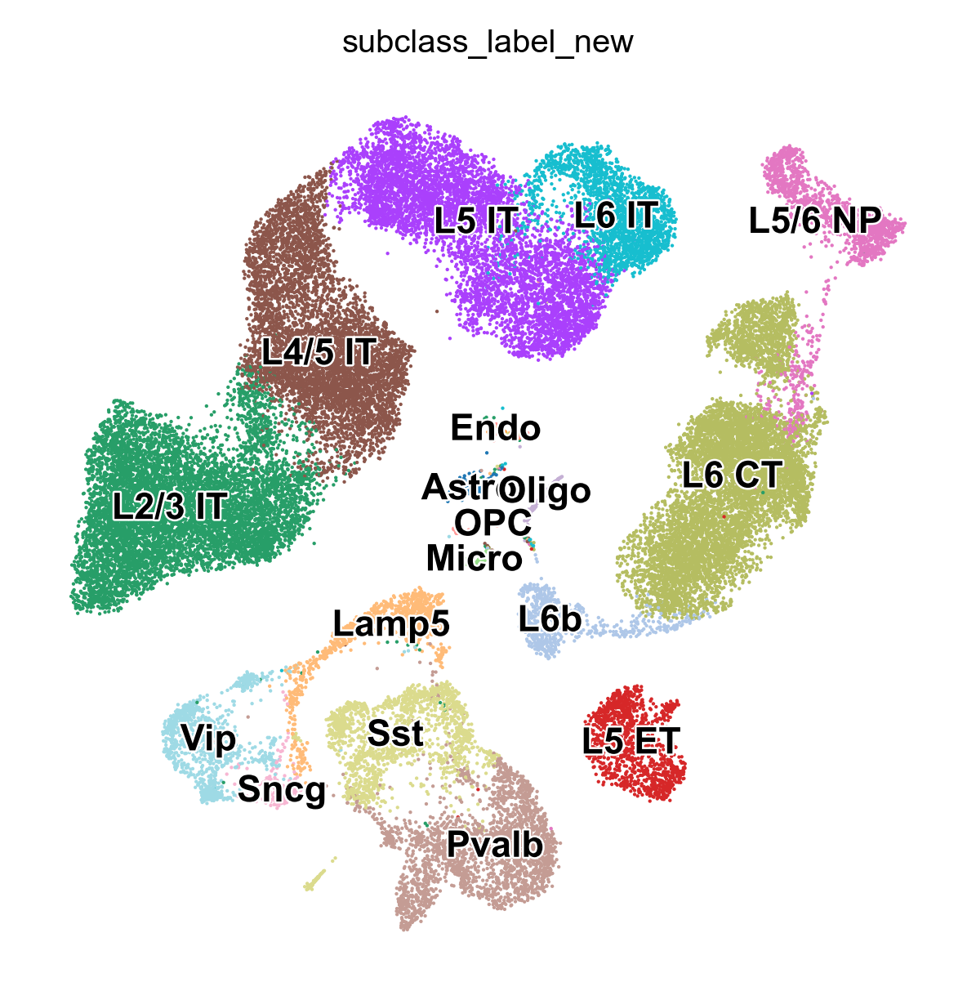

In [40]:
sc.pl.umap(adata, color='subclass_label_new', 
           legend_loc='on data',legend_fontsize=9,legend_fontoutline=1)

# 6. Add new class annotation

## 6.1 Major 'classes'

In [41]:
# duplicate the column for manual labeling of the final classes
adata.obs['class_label_new'] = adata.obs['subclass_label_new'] 

In [42]:
new_class_dict = {}

for _class in ['L2/3 IT', 'L4/5 IT', 'L5 ET', 'L5 IT', 'L5/6 NP','L6 CT', 'L6 IT', 'L6b','L6 IT Car3']:
    new_class_dict[_class]='Gluta'
    
for _class in ['Lamp5','Pvalb', 'Sncg', 'Sst', 'Vip']:
    new_class_dict[_class]='GABA'
    
for _class in ['OPC','Oligo']:
    new_class_dict[_class]='Oligo'
    
for _class in ['Astro']:
    new_class_dict[_class]='Astro'
    
for _class in ['Micro']:
    new_class_dict[_class]='Micro'
    
for _class in ['Endo']:
    new_class_dict[_class]='Endo'

new_class_dict   

{'L2/3 IT': 'Gluta',
 'L4/5 IT': 'Gluta',
 'L5 ET': 'Gluta',
 'L5 IT': 'Gluta',
 'L5/6 NP': 'Gluta',
 'L6 CT': 'Gluta',
 'L6 IT': 'Gluta',
 'L6b': 'Gluta',
 'L6 IT Car3': 'Gluta',
 'Lamp5': 'GABA',
 'Pvalb': 'GABA',
 'Sncg': 'GABA',
 'Sst': 'GABA',
 'Vip': 'GABA',
 'OPC': 'Oligo',
 'Oligo': 'Oligo',
 'Astro': 'Astro',
 'Micro': 'Micro',
 'Endo': 'Endo'}

In [43]:
# re-label subclass based on Cux2 and Rorb expression level

new_class_label_dict ={'class_label_new':new_class_dict}

adata.obs = adata.obs.replace(new_class_label_dict)


In [44]:
np.unique(adata.obs['class_label_new'] )

array(['Astro', 'Endo', 'GABA', 'Gluta', 'Micro', 'Oligo'], dtype=object)

## 6.2 Neuron vs non-Neuron

In [45]:
# duplicate the column for manual labeling of the final classes
adata.obs['neuron_identity'] = adata.obs['class_label'] 

In [46]:
# re-label subclass based on Cux2 and Rorb expression level

new_class_dict = {}

new_class_dict['Glutamatergic']='Neuronal'
new_class_dict['GABAergic']='Neuronal'
new_class_dict['Non-Neuronal']='Non-Neuronal'

new_class_label_dict ={'neuron_identity':new_class_dict}

adata.obs = adata.obs.replace(new_class_label_dict)

np.unique(adata.obs['neuron_identity'] )

array(['Neuronal', 'Non-Neuronal'], dtype=object)

# 7. Save the labeled annData

In [47]:
adata.write(os.path.join(data_path,r'MOp_10x_sn_labeled.h5ad'))